In [1]:
import torch
import torchvision
from torch import nn
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, Dataset
import torch.nn.functional as F
import cv2, os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# 튜토리얼

In [2]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet101', pretrained=True)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
model.eval()

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [4]:
# import urllib
# url, filename = ("https://github.com/pytorch/hub/raw/master/images/deeplab1.png", "deeplab1.png")
# try: urllib.URLopener().retrieve(url, filename)
# except: urllib.request.urlretrieve(url, filename)

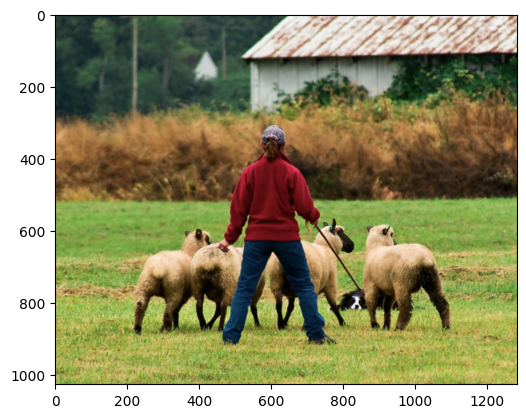

In [12]:
plt.imshow(input_image)

## 이미지 cv2 또는 Image로 불러오기
- cv2로 불러오면 ascontiguousarray로 연속적인 메모리 블록에 해줘야함..?

In [10]:
from PIL import Image
from torchvision import transforms
# input_image = Image.open(filename)
# input_image = input_image.convert("RGB")
input_image = cv2.imread("./deeplab1.png")
input_image = np.ascontiguousarray(input_image)

preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

# move the input and model to GPU for speed if available
if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')

with torch.no_grad():
    output = model(input_batch)['out'][0]
output_predictions = output.argmax(0)

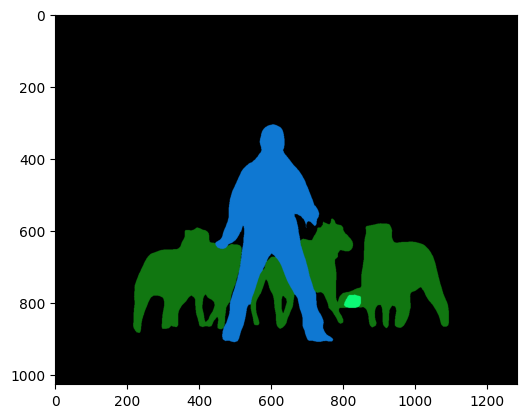

In [6]:
# 각 객체별로 컬러 부여하는 코드
palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
colors = (colors % 255).numpy().astype("uint8")

r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
r.putpalette(colors)

import matplotlib.pyplot as plt
plt.imshow(r)
# plt.show()

In [38]:
preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(size=(512,512))
])
temp_img = cv2.imread("./3906.jpg")[...,::-1]
#temp_img = np.transpose(temp_img,(2,0,1))
temp_img = np.ascontiguousarray(temp_img)
temp_tensor = preprocess(temp_img)
temp_batch = temp_tensor.unsqueeze(0)

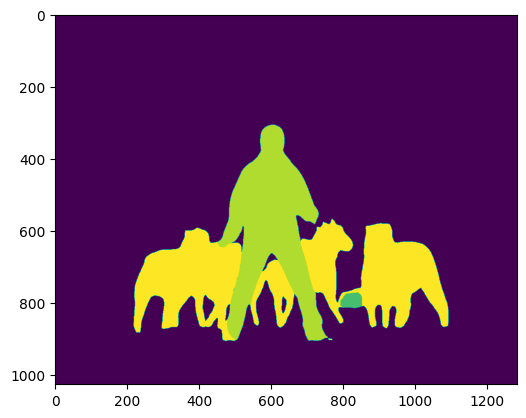

In [18]:
# 이미지를 cuda에서 cpu로 할당해 줘야 함.
plt.imshow(output_predictions.cpu())

# Data 전처리

In [2]:
def one_hot_encode(labels, num_classes):
    # 라벨 이미지가 (H, W) 형태로 주어지고 각 픽셀에는 클래스 인덱스가 저장되어 있다고 가정
    # one-hot 인코딩된 배열을 (num_classes, H, W) 형태로 반환
    one_hot = torch.zeros((num_classes, 1024, 1024), dtype=torch.float32)
    for c in range(num_classes):
        one_hot[c] = (labels == c).float()
    return one_hot

In [143]:
def cutout(image,label, max_holes=5, max_length=40):
    c, h, w = image.shape
    mask = np.ones((h, w, c), dtype=np.float32)
    holes = np.random.randint(0, max_holes + 1)

    for n in range(holes):
        y = np.random.randint(h)
        x = np.random.randint(w)
        length = np.random.randint(1, max_length + 1)
        y1 = np.clip(y-length//2, 0, h)
        y2 = np.clip(y+length//2, 0, h)
        x1 = np.clip(x-length//2, 0, w)
        x2 = np.clip(x+length//2, 0, w)
        mask[y1:y2, x1:x2, :] = 0
    
    mask = np.transpose(mask,(2,1,0))
    image = image * mask
    label = label * np.concatenate([mask,mask,np.expand_dims(mask[0],0)],0)
    
    return image,label

### custom dataset 구버전

In [100]:
class CustomDataset(Dataset):
    def __init__(self, image_dir, label_dir, num_classes, transform=None):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.transform = transform
        self.images = os.listdir(image_dir)
        self.num_classes = num_classes

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx].split(".")[0]
        img_path = os.path.join(self.image_dir, img_name+".jpg")
        label_path = os.path.join(self.label_dir, img_name+".png")
        image = Image.open(img_path).convert("RGB")
        label = Image.open(label_path).convert("L")  # 라벨은 회색조 이미지

        if self.transform:
            image = self.transform(image)
        
        label = transforms.ToTensor()(label)  # 라벨을 텐서로 변환
        label = one_hot_encode(label, self.num_classes)  # one-hot 인코딩
        label = transforms.Resize((512,512))(label)

        return image, label

### cv2 버전

In [3]:
class CustomDataset(Dataset):
    def __init__(self, image_dir, label_dir, num_classes, transform=None):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.transform = transform
        self.images = os.listdir(image_dir)
        self.num_classes = num_classes

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx].split(".")[0]
        img_path = os.path.join(self.image_dir, img_name+".jpg")
        label_path = os.path.join(self.label_dir, img_name+".png")
        image = Image.open(img_path).convert("RGB")
        label = Image.open(label_path).convert("L")  # 라벨은 회색조 이미지
        
        label = np.array(label, dtype=np.int64)
        label = torch.from_numpy(label)
        label = one_hot_encode(label, self.num_classes)
        
        if self.transform:
            image = self.transform(image)
        
        label = transforms.Resize((512,512),interpolation=transforms.InterpolationMode.NEAREST)(label)
        #image,label = cutout(image,label)
        
        return image, label

In [101]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((512, 512)),# 모델에 맞는 크기 조정
])

train_dataset = CustomDataset(
    image_dir="/root/jupyter/MOON/NEW_PROJECT/ishape/ishape_dataset/_semantic/image/",
    label_dir="/root/jupyter/MOON/NEW_PROJECT/ishape/ishape_dataset/_semantic/label/",
    num_classes = 7,
    transform=transform
)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

In [6]:
def calculate_miou(preds, labels, num_classes):
    miou_total = 0.0
    ious = []
    for c in range(num_classes):
        intersection = ((preds == c) & (labels == c)).float().sum()  # True Positive
        union = ((preds == c) | (labels == c)).float().sum()  # Union = True Positive + False Positive + False Negative
        if union == 0:
            iou = float('nan')  # Avoid division by zero
        else:
            iou = intersection / union
        if not torch.isnan(torch.tensor(iou)):
            ious.append(iou)
    
    miou_total = torch.tensor(ious).nanmean()  # Compute mean IoU excluding NaNs
    return miou_total

# 모델 재구성

In [4]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet101', pretrained=True,weights=None, num_classes=7)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


# 학습

In [5]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using GPU:", torch.cuda.get_device_name(0))
else:
    device = torch.device("cpu")
    print("Using CPU")
    

model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

Using GPU: NVIDIA GeForce RTX 3090


In [ ]:
num_classes = 7
num_epochs = 100

num_steps = 0
best_miou = 0

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0.0
    epoch_miou = 0.0
    
    for images, labels in train_loader:
        if images.shape!=torch.Size([8, 3, 512, 512]):
            continue
        images = images.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)['out']  # Model output
        _, preds = torch.max(outputs, 1)  # Get the predicted classes
        labels = torch.argmax(labels, dim=1)  # Convert one-hot to integer labels
        loss = F.cross_entropy(outputs, labels)
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        epoch_miou += calculate_miou(preds, labels, num_classes)
        if num_steps%500 == 0:
            print("step :",num_steps)
        num_steps+=1
        
    # Calculate average loss and miou
    epoch_loss /= len(train_loader)
    epoch_miou /= len(train_loader)
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f},') #mIoU: {epoch_miou:.4f}')
    if epoch_miou>best_miou:
        best_miou = epoch_miou
        torch.save(model.state_dict(),"semantic_best.pth")

/usr/local/lib/python3.8/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/tmp/ipykernel_2106429/147641318.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if not torch.isnan(torch.tensor(iou)):


step : 0
step : 500
step : 1000
Epoch 1/100, Loss: 0.3598,
step : 1500
step : 2000
step : 2500
Epoch 2/100, Loss: 0.1519,
step : 3000
step : 3500
Epoch 3/100, Loss: 0.1502,
step : 4000


### validation 평가

In [145]:
valid_dataset = CustomDataset(
    image_dir="/root/jupyter/MOON/NEW_PROJECT/ishape/ishape_dataset/_semantic/val/image/",
    label_dir="/root/jupyter/MOON/NEW_PROJECT/ishape/ishape_dataset/_semantic/val/label/",
    num_classes = 7,
    transform=transform
)

valid_loader = DataLoader(valid_dataset, batch_size=8, shuffle=True)

In [94]:
model.eval()

epoch_loss = 0.0
epoch_miou = 0.0
step_count = 0

num_classes = 7
with torch.no_grad():
    for images, labels in valid_loader:
        if images.shape!=torch.Size([8, 3, 512, 512]):
            continue
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)['out']  # Model output
        _, preds = torch.max(outputs, 1)  # Get the predicted classes
        labels = torch.argmax(labels, dim=1)  # Convert one-hot to integer labels
        loss = F.cross_entropy(outputs, labels)
        
        epoch_loss += loss.item()
        epoch_miou += calculate_miou(preds, labels, num_classes)
        step_count+=1

    # Calculate average loss and miou
    #epoch_loss /= len(valid_loader)
    #epoch_miou /= len(valid_loader)
    epoch_loss /= step_count
    epoch_miou /= step_count
    print(f'Loss: {epoch_loss:.4f}, #mIoU: {epoch_miou:.4f}')

/usr/local/lib/python3.8/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/tmp/ipykernel_2106429/147641318.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if not torch.isnan(torch.tensor(iou)):


Loss: 0.0520, #mIoU: 0.9325


In [146]:
key_dict = {
'fence':1,
'branch':2,
'log':3,
'hanger':4,
'wire':5,
'antenna':6
}
miou_list = [0,0,0,0,0,0,0]
miou_count = [0,0,0,0,0,0,0]

In [147]:
model.eval()

epoch_loss = 0.0
epoch_miou = 0.0

num_classes = 7
with torch.no_grad():
    for images, labels in valid_loader:
        if images.shape!=torch.Size([8, 3, 512, 512]):
            continue
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)['out']  # Model output
        _, preds = torch.max(outputs, 1)  # Get the predicted classes
        loss = F.cross_entropy(outputs, labels)
        labels = torch.argmax(labels, dim=1)  # Convert one-hot to integer labels
        for i in range(8):
            idx = int(torch.max(labels[i]).cpu())
            miou_list[idx] += calculate_miou(preds[i], labels[i], num_classes)
            miou_count[idx] += 1
        #epoch_loss += loss.item()
        #epoch_miou += calculate_miou(preds, labels, num_classes)

    # Calculate average loss and miou
    # epoch_loss /= len(valid_loader)
    # epoch_miou /= len(valid_loader)
    # print(f'Loss: {epoch_loss:.4f}, #mIoU: {epoch_miou:.4f}')

/tmp/ipykernel_2106429/147641318.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if not torch.isnan(torch.tensor(iou)):


In [96]:
print(miou_list)
print(miou_count)

[0, tensor(461.4883), tensor(449.5169), tensor(486.3632), tensor(463.6659), tensor(482.2899), tensor(179.8237)]
[0, 499, 499, 500, 499, 498, 185]


In [148]:
for i in range(1,7):
    print(miou_list[i]/miou_count[i])

tensor(0.9159)
tensor(0.7537)
tensor(0.7875)
tensor(0.7357)
tensor(0.8405)
tensor(0.9594)


In [140]:
sum(miou_list)/sum(miou_count)

tensor(0.7271)

In [92]:
sum(miou_count)

2680

In [91]:
len(valid_loader)

336

# Post Processing

In [6]:
# 모델 로드
model.load_state_dict(torch.load('semantic_best.pth'))

<All keys matched successfully>

## Train 시각화

In [8]:
def gen_img():
    for img,label in train_loader:
        yield img,label

test_img_gen = gen_img()

/usr/local/lib/python3.8/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


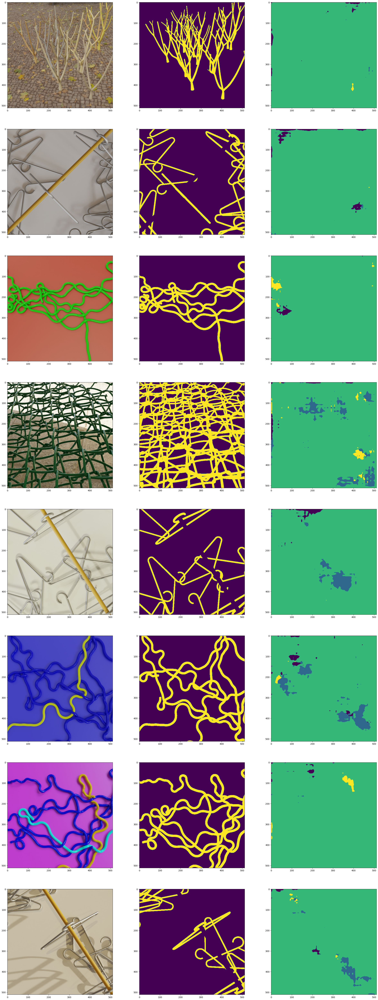

In [9]:
img,label = next(test_img_gen)
img = img.to(device)
label = label.to(device)

model.eval()
with torch.no_grad():
    output = model(img)['out']

plt.figure(figsize=(30,80))
idx=1
for i in range(0,8):
    plt.subplot(8,3,idx)
    plt.imshow(np.transpose(img[i].cpu(),(1,2,0)))
    idx+=1
    
    plt.subplot(8,3,idx)
    plt.imshow(np.transpose(label[i].cpu(),(1,2,0)).argmax(2))
    idx+=1
    
    plt.subplot(8,3,idx)
    plt.imshow(output[i].argmax(0).cpu())
    idx+=1

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

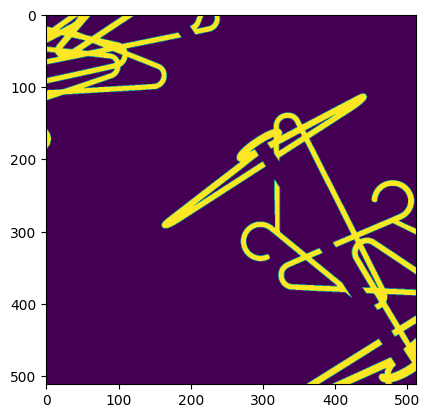

In [24]:
plt.imshow(label[7][4].cpu())
label[7][4].cpu()

In [38]:
np.histogram(label[7][6].cpu())

(array([     0,      0,      0,      0,      0, 262144,      0,      0,
             0,      0]),
 array([-0.5, -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5],
       dtype=float32))

## valid 시각화

In [141]:
valid_dataset = CustomDataset(
    image_dir="/root/jupyter/MOON/NEW_PROJECT/ishape/ishape_dataset/_semantic/val/image/",
    label_dir="/root/jupyter/MOON/NEW_PROJECT/ishape/ishape_dataset/_semantic/val/label/",
    num_classes = 7,
    transform=transform
)

valid_loader = DataLoader(valid_dataset, batch_size=8, shuffle=True)

def gen_img():
    for img,label in valid_loader:
        yield img,label

test_img_gen = gen_img()

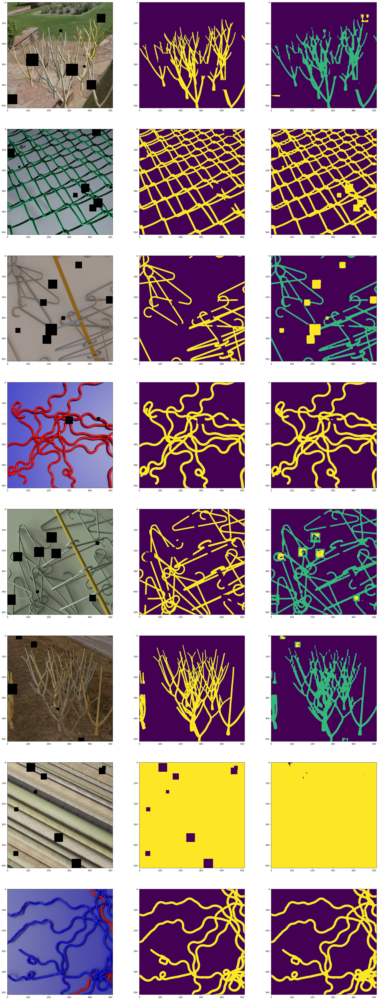

In [142]:
img,label = next(test_img_gen)
img = img.to(device)
label = label.to(device)

model.eval()
with torch.no_grad():
    output = model(img)

plt.figure(figsize=(30,80))
idx=1
for i in range(0,8):
    plt.subplot(8,3,idx)
    plt.imshow(np.transpose(img[i].cpu(),(1,2,0)))
    idx+=1
    
    plt.subplot(8,3,idx)
    plt.imshow(np.transpose(label[i].cpu(),(1,2,0)).argmax(2))
    idx+=1
    
    plt.subplot(8,3,idx)
    plt.imshow(output['out'][i].argmax(0).cpu())
    idx+=1

## 모델 저장

In [10]:
# 모델의 상태 사전 저장
torch.save(model.state_dict(), 'deeplabv3.pth')

# 이후에 모델을 다시 불러오려면, 먼저 모델 구조를 정의하고 상태 사전을 로드합니다.
# model = YourModelClass(*args, **kwargs)
# model.load_state_dict(torch.load('model_weights.pth'))
# model.eval()  # 평가 모드로 설정

In [44]:
# 모델 로드
model.load_state_dict(torch.load('semantic_last.pth'))

<All keys matched successfully>

In [45]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((512, 512)),# 모델에 맞는 크기 조정
])

test_dataset = CustomDataset(
    image_dir="./test/",
    label_dir="./test_aff/",
    num_classes = 7,
    transform=transform
)

test_loader = DataLoader(test_dataset, batch_size=8, shuffle=True)

In [46]:
def gen_img():
    for img,label in test_loader:
        yield img,label

test_img_gen = gen_img()

img,_ = next(test_img_gen)

img = img.to(device)

model.eval()
with torch.no_grad():
    output = model(img)

In [47]:
output['out'][0].shape

torch.Size([7, 512, 512])

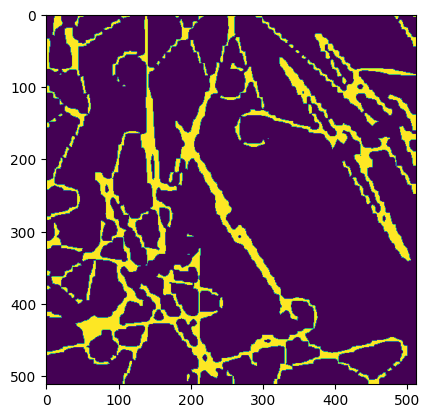

In [48]:
plt.imshow(output['out'][0,4].cpu()>0.5)

In [49]:
np.save("./merge_seg.npy",output['out'][0].cpu())